In [ ]:
%pip install folium lightgbm statsmodels xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.9/110.9 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 52.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 122.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 253.9/253.9 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.9/232.9 kB 16.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 201.3/201.3 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.4/88.4 kB 5.9 MB/s eta 0:00:00


In [ ]:
# Import dependencies

import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import folium
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
from lightgbm import LGBMRegressor

In [ ]:
df = pd.read_csv(r"/content/Crime_Data_from_2020_to_Present.csv")  #Read Dataset
df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,190326475,03/01/2020 12:00:00 AM,03/01/2020 12:00:00 AM,2130,7,Wilshire,784,1,510,VEHICLE - STOLEN,...,AA,Adult Arrest,510.0,998.0,NaN,NaN,1900 S LONGWOOD AV,NaN,34.0375,-118.3506
1,200106753,02/09/2020 12:00:00 AM,02/08/2020 12:00:00 AM,1800,1,Central,182,1,330,BURGLARY FROM VEHICLE,...,IC,Invest Cont,330.0,998.0,NaN,NaN,1000 S FLOWER ST,NaN,34.0444,-118.2628
2,200320258,11/11/2020 12:00:00 AM,11/04/2020 12:00:00 AM,1700,3,Southwest,356,1,480,BIKE - STOLEN,...,IC,Invest Cont,480.0,NaN,NaN,NaN,1400 W 37TH ST,NaN,34.0210,-118.3002
3,200907217,05/10/2023 12:00:00 AM,03/10/2020 12:00:00 AM,2037,9,Van Nuys,964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),...,IC,Invest Cont,343.0,NaN,NaN,NaN,14000 RIVERSIDE DR,NaN,34.1576,-118.4387
4,220614831,08/18/2022 12:00:00 AM,08/17/2020 12:00:00 AM,1200,6,Hollywood,666,2,354,THEFT OF IDENTITY,...,IC,Invest Cont,354.0,NaN,NaN,NaN,1900 TRANSIENT,NaN,34.0944,-118.3277


In [ ]:
df.info()
df.describe()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 360081 entries, 0 to 360080
Data columns (total 28 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DR_NO           360081 non-null  int64  
 1   Date Rptd       360081 non-null  object 
 2   DATE OCC        360081 non-null  object 
 3   TIME OCC        360081 non-null  int64  
 4   AREA            360081 non-null  int64  
 5   AREA NAME       360081 non-null  object 
 6   Rpt Dist No     360081 non-null  int64  
 7   Part 1-2        360081 non-null  int64  
 8   Crm Cd          360081 non-null  int64  
 9   Crm Cd Desc     360081 non-null  object 
 10  Mocodes         310633 non-null  object 
 11  Vict Age        360081 non-null  int64  
 12  Vict Sex        312943 non-null  object 
 13  Vict Descent    312938 non-null  object 
 14  Premis Cd       360077 non-null  float64
 15  Premis Desc     359937 non-null  object 
 16  Weapon Used Cd  129465 non-null  float64
 17  Weapon Des

,DR_NO,TIME OCC,AREA,Rpt Dist No,Part 1-2,Crm Cd,Vict Age,Premis Cd,Weapon Used Cd,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LAT,LON
count,3.600810e+05,360081.000000,360081.000000,360081.000000,360081.000000,360081.000000,360081.000000,360077.000000,129465.000000,360076.000000,28828.000000,984.000000,33.000000,360080.000000,360080.000000
mean,2.060449e+08,1348.234228,10.809959,1127.202313,1.415304,506.780847,30.067582,298.545933,362.369783,506.505249,953.268038,980.545732,987.939394,33.890249,-117.719171
std,5.707267e+06,650.635020,6.049892,605.086449,0.492775,209.912618,21.701467,214.347897,123.110670,209.701635,117.314940,58.044656,35.513148,2.492956,8.651219
min,8.170000e+02,1.000000,1.000000,101.000000,1.000000,110.000000,-4.000000,101.000000,101.000000,110.000000,210.000000,434.000000,821.000000,0.000000,-118.667600
25%,2.010161e+08,915.000000,6.000000,632.000000,1.000000,330.000000,12.000000,101.000000,308.000000,330.000000,998.000000,998.000000,998.000000,34.010200,-118.430700
50%,2.020130e+08,1430.000000,11.000000,1149.000000,1.000000,480.000000,31.000000,203.000000,400.000000,480.000000,998.000000,998.000000,998.000000,34.058100,-118.322500
75%,2.111068e+08,1900.000000,16.000000,1622.000000,2.000000,626.000000,45.000000,501.000000,400.000000,626.000000,998.000000,998.000000,998.000000,34.164500,-118.274300
max,2.421098e+08,2359.000000,21.000000,2199.000000,2.000000,956.000000,120.000000,974.000000,516.000000,956.000000,999.000000,999.000000,999.000000,34.329700,0.000000


In [ ]:
print(df.isnull().sum())  # Should print 0 missing values

DR_NO                  0
Date Rptd              0
DATE OCC               0
TIME OCC               0
AREA                   0
AREA NAME              0
Rpt Dist No            0
Part 1-2               0
Crm Cd                 0
Crm Cd Desc            0
Mocodes            49448
Vict Age               0
Vict Sex           47138
Vict Descent       47143
Premis Cd              4
Premis Desc          144
Weapon Used Cd    230616
Weapon Desc       230616
Status                 1
Status Desc            1
Crm Cd 1               5
Crm Cd 2          331253
Crm Cd 3          359097
Crm Cd 4          360048
LOCATION               1
Cross Street      297429
LAT                    1
LON                    1
dtype: int64


In [ ]:
df = df.dropna()


In [ ]:
# Change column types of dates -5 rows × 28 columns

df['Date Rptd'] = pd.to_datetime(df['Date Rptd'])
df['DATE OCC'] = pd.to_datetime(df['DATE OCC'])
df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
65996,201904032,2020-01-02,2020-01-01,2135,19,Mission,1924,1,761,BRANDISH WEAPON,...,AA,Adult Arrest,761.0,930.0,997.0,998.0,ASTORIA ST,SAN FERNANDO RD,34.2949,-118.4571
86494,200613424,2020-08-02,2020-08-02,2030,6,Hollywood,657,1,761,BRANDISH WEAPON,...,AO,Adult Other,761.0,920.0,930.0,998.0,WESTERN,ROMAINE,34.0885,-118.3092


In [ ]:
# Value counts of Crm Cd Desc
df['Crm Cd Desc'].value_counts()


,count
Crm Cd Desc,
BRANDISH WEAPON,2


In [ ]:
print(len(df))


2


In [ ]:
# EDA
# Crimes density by latitude and longitude using a sample.

# Create a base map
m = folium.Map(location=[df['LAT'].mean(), df['LON'].mean()], zoom_start=10)

# Create a random sample of 200 rows from df
df_sample = df.sample(n=200 , random_state=1)
# df_sample = df.sample(n=min(200, len(df)), random_state=1)


# Add points to the map
for idx, row in df_sample.iterrows():
    folium.Marker(
        location=[row['LAT'], row['LON']],
        popup=row['Crm Cd Desc']
    ).add_to(m)

# Display the map
m



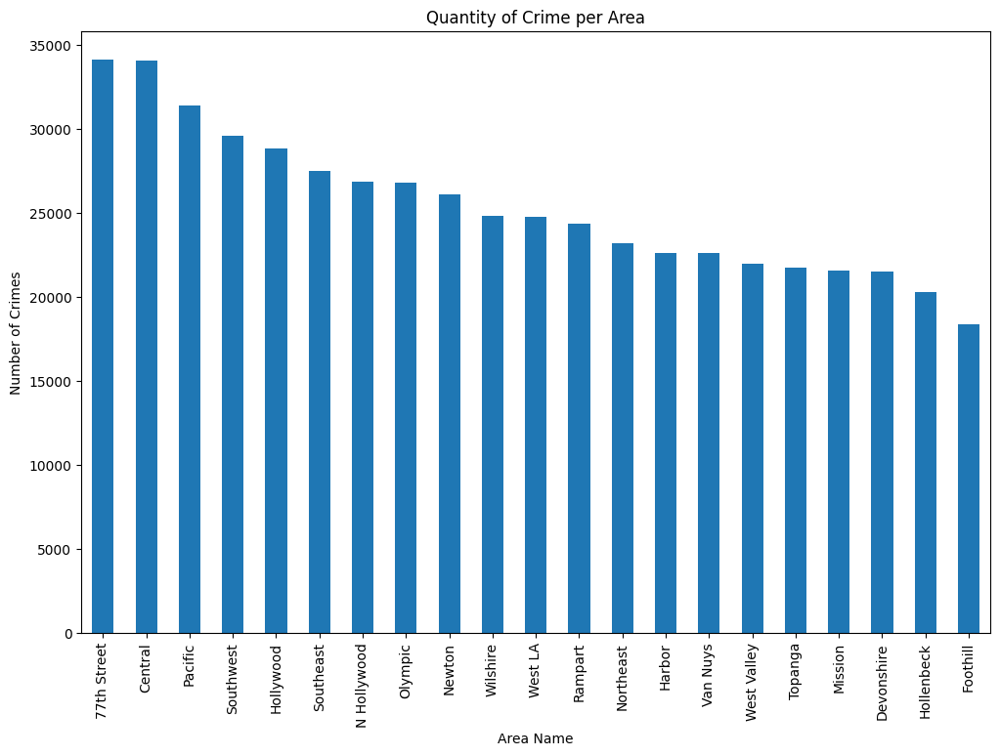

In [ ]:
# Qty of crime by area

# Group by 'AREA NAME' and count the number of occurrences
crime_per_area = df['AREA NAME'].value_counts()

# Plot the data
plt.figure(figsize=(12, 8))
crime_per_area.plot(kind='bar')
plt.title('Quantity of Crime per Area')
plt.xlabel('Area Name')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=90)
plt.show()

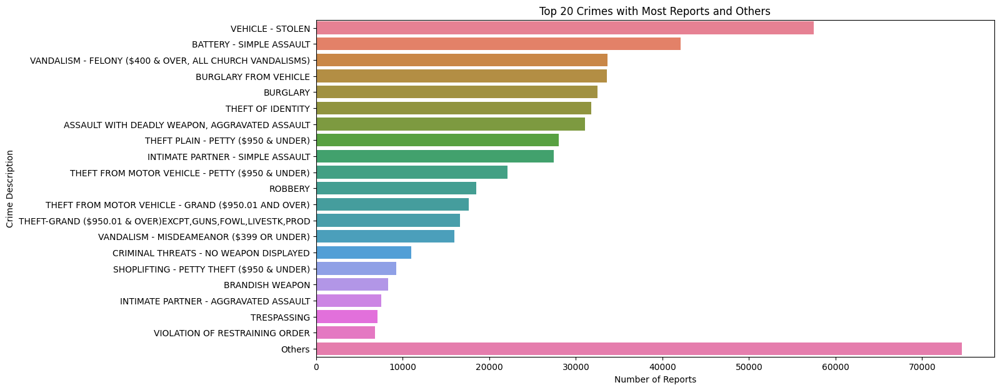

In [ ]:
# Get the top 20 crimes
top_20_crimes = df['Crm Cd Desc'].value_counts().nlargest(20)

# Create a new column for plotting
df['Crm Cd Desc Plot'] = df['Crm Cd Desc'].apply(lambda x: x if x in top_20_crimes.index else 'Others')

# Ensure 'Others' appears at the end
df['Crm Cd Desc Plot'] = pd.Categorical(df['Crm Cd Desc Plot'], categories=list(top_20_crimes.index) + ['Others'], ordered=True)

# Generate a list of colors
colors = sns.color_palette("husl", len(top_20_crimes) + 1)  # 'husl' gives vibrant distinct colors

# Plot the data
plt.figure(figsize=(14, 7))
sns.countplot(
    y='Crm Cd Desc Plot',
    data=df,
    order=list(top_20_crimes.index) + ['Others'],
    palette=colors
)

plt.title('Top 20 Crimes with Most Reports and Others')
plt.xlabel('Number of Reports')
plt.ylabel('Crime Description')
plt.show()

In [ ]:
# Clustering -  Using a sample we will cluster the crimes by latitude, longitude and type of crime.
# 5 rows × 31 columns


# Select a smaller sample of features for clustering
sample_df = df.sample(n=10000, random_state=1)
features = ['LAT', 'LON', 'Crm Cd']

# Standardize the features
scaler = StandardScaler()
sample_df_scaled = scaler.fit_transform(sample_df[features])

# Perform Agglomerative Clustering
agg_clustering = AgglomerativeClustering(n_clusters=20)
sample_df['Cluster'] = agg_clustering.fit_predict(sample_df_scaled)

# Display the first few rows to verify the new column
sample_df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,Crm Cd Desc Plot,Cluster
438090,220908325,04/22/2022 12:00:00 AM,04/22/2022 12:00:00 AM,2100,9,Van Nuys,984,2,888,TRESPASSING,...,888.0,NaN,NaN,NaN,14500 GREENLEAF ST,NaN,34.1482,-118.4494,TRESPASSING,11
78713,201220658,09/14/2020 12:00:00 AM,09/14/2020 12:00:00 AM,1400,12,77th Street,1232,1,230,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",...,230.0,NaN,NaN,NaN,2900 W 59TH ST,NaN,33.9872,-118.3255,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",0
228913,210811449,07/09/2021 12:00:00 AM,06/18/2021 12:00:00 AM,1200,8,West LA,836,2,354,THEFT OF IDENTITY,...,354.0,NaN,NaN,NaN,1800 PELHAM AV,NaN,34.0516,-118.4316,THEFT OF IDENTITY,15
297549,211815455,08/19/2021 12:00:00 AM,08/18/2021 12:00:00 AM,2330,18,Southeast,1842,1,510,VEHICLE - STOLEN,...,510.0,NaN,NaN,NaN,111TH ST,BROADWAY,33.9348,-118.2781,VEHICLE - STOLEN,6
219731,210506335,02/28/2021 12:00:00 AM,02/28/2021 12:00:00 AM,755,5,Harbor,507,2,624,BATTERY - SIMPLE ASSAULT,...,624.0,NaN,NaN,NaN,1600 PLAZA DEL AMO,NaN,33.8220,-118.3064,BATTERY - SIMPLE ASSAULT,8


In [ ]:
# Plotting clusters in a map

# Create a base map centered around the mean latitude and longitude
map_clusters = folium.Map(location=[sample_df['LAT'].mean(), sample_df['LON'].mean()], zoom_start=10)

# Define a color palette for the clusters
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen',
          'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray', 'brown']

# Add points to the map
for idx, row in sample_df.iterrows():
    folium.CircleMarker(
        location=[row['LAT'], row['LON']],
        radius=5,
        color=colors[row['Cluster'] % len(colors)],
        fill=True,
        fill_color=colors[row['Cluster'] % len(colors)],
        fill_opacity=0.7,
        popup=f"Cluster: {row['Cluster']}\nCrime: {row['Crm Cd Desc']}"
    ).add_to(map_clusters)

# Display the map
map_clusters

In [ ]:
# Ensure 'DATE OCC' is in datetime format before pivoting
df['DATE OCC'] = pd.to_datetime(df['DATE OCC'])

# Recreate the pivot table
pivot_df = df.pivot_table(
    index='DATE OCC',
    columns=['AREA NAME', 'Crm Cd'],
    values='DR_NO',
    aggfunc='count',
    fill_value=0
)

# Ensure the index is a DatetimeIndex
pivot_df.index = pd.to_datetime(pivot_df.index)

# Apply frequency adjustment
pivot_df = pivot_df.asfreq('D', method='bfill')  # Fill missing values with the previous value

# Display the first few rows
pivot_df.head()


AREA NAME  77th Street                                      ... Wilshire      \
Crm Cd             110 113 121 122 210 220 230 231 235 236  ...      932 933   
DATE OCC                                                    ...                
2020-01-01           0   0   2   0   4   1   4   0   0   3  ...        0   0   
2020-01-02           0   0   0   0   4   0   6   0   0   0  ...        0   0   
2020-01-03           0   0   0   0   3   0   6   0   0   0  ...        0   0   
2020-01-04           0   0   1   0   1   0   1   0   0   0  ...        0   0   
2020-01-05           0   0   0   0   2   2   2   0   0   0  ...        0   0   

AREA NAME                                   
Crm Cd     940 943 944 946 949 950 951 956  
DATE OCC                                    
2020-01-01   0   0   0   2   0   0   0   2  
2020-01-02   0   0   0   0   0   0   0   1  
2020-01-03   0   0   0   0   0   0   0   0  
2020-01-04   0   0   0   0   0   0   0   0  
2020-01-05   0   0   0   0   0   0   0   0  

[5 rows x 2247 columns]

In [ ]:
import pandas as pd

# Ensure 'DATE OCC' is in datetime format
df['DATE OCC'] = pd.to_datetime(df['DATE OCC'])

# Create a pivot table with the sum of each Crime Cd by Area by date
pivot_df = df.pivot_table(index='DATE OCC', columns=['AREA NAME', 'Crm Cd'], values='DR_NO', aggfunc='count', fill_value=0)

# Resample data to daily frequency and fill missing values with the previous value
pivot_df = pivot_df.resample('D').ffill()  # Forward fill missing values

# Display the first few rows of the pivot table
pivot_df.head()


AREA NAME  77th Street                                      ... Wilshire      \
Crm Cd             110 113 121 122 210 220 230 231 235 236  ...      932 933   
DATE OCC                                                    ...                
2020-01-01           0   0   2   0   4   1   4   0   0   3  ...        0   0   
2020-01-02           0   0   0   0   4   0   6   0   0   0  ...        0   0   
2020-01-03           0   0   0   0   3   0   6   0   0   0  ...        0   0   
2020-01-04           0   0   1   0   1   0   1   0   0   0  ...        0   0   
2020-01-05           0   0   0   0   2   2   2   0   0   0  ...        0   0   

AREA NAME                                   
Crm Cd     940 943 944 946 949 950 951 956  
DATE OCC                                    
2020-01-01   0   0   0   2   0   0   0   2  
2020-01-02   0   0   0   0   0   0   0   1  
2020-01-03   0   0   0   0   0   0   0   0  
2020-01-04   0   0   0   0   0   0   0   0  
2020-01-05   0   0   0   0   0   0   0   0  

[5 rows x 2247 columns]

In [ ]:
# Resample pivot_df by month and sum the columns  - 5 rows × 2389 columns
monthly_crime_sum = pivot_df.resample('M').sum()

monthly_crime_sum.asfreq('M')
# Display the first few rows of the resampled DataFrame
monthly_crime_sum.head()



AREA NAME  77th Street                                       ... Wilshire      \
Crm Cd             110 113 121 122 210 220  230 231 235 236  ...      932 933   
DATE OCC                                                     ...                
2020-01-31           5   0   9   0  75  11  102   0   0  20  ...        0   0   
2020-02-29           1   0   5   4  92  12   85   2   0  31  ...        0   0   
2020-03-31           2   0   7   1  67   6   86   1   1  32  ...        1   0   
2020-04-30           5   0   5   0  48   8  109   3   2  37  ...        0   0   
2020-05-31           2   0   3   0  52   8  152   1   3  33  ...        0   0   

AREA NAME                                   
Crm Cd     940 943 944 946 949 950 951 956  
DATE OCC                                    
2020-01-31   2   0   0   9   0   0   1   9  
2020-02-29   2   0   0  12   0   1   0  10  
2020-03-31   1   0   0   7   0   0   0   6  
2020-04-30   0   0   0   5   0   0   0  10  
2020-05-31   1   0   0  11   0   1   0   8  

[5 rows x 2247 columns]

In [ ]:
# Manual Time Series Forecasting (Autoregressive Approach)

def autoregressive_forecast(data, n_lags, n_steps):
    predictions = []
    for _ in range(n_steps):
        value = np.mean(data[-n_lags:])  # Simple average for prediction
        predictions.append(value)
        data = np.append(data, value)
    return predictions

# Example usage
data = np.array([10, 12, 13, 15, 18, 20])
forecast = autoregressive_forecast(data, n_lags=3, n_steps=5)
print(forecast)


[np.float64(17.666666666666668), np.float64(18.555555555555557), np.float64(18.740740740740744), np.float64(18.32098765432099), np.float64(18.539094650205765)]


In [ ]:
# Convert 'Date Rptd' to datetime format
df['Date Rptd'] = pd.to_datetime(df['Date Rptd'], errors='coerce')  # 'coerce' turns invalid dates to NaT

# Extract year and month
df['YearMonth'] = df['Date Rptd'].dt.to_period('M')

# Group by 'YearMonth' and count occurrences
monthly_counts = df.groupby('YearMonth').size()

# Display the first few rows
print(monthly_counts.head())


YearMonth
2020-01    16060
2020-02    16490
2020-03    15539
2020-04    15179
2020-05    16331
Freq: M, dtype: int64


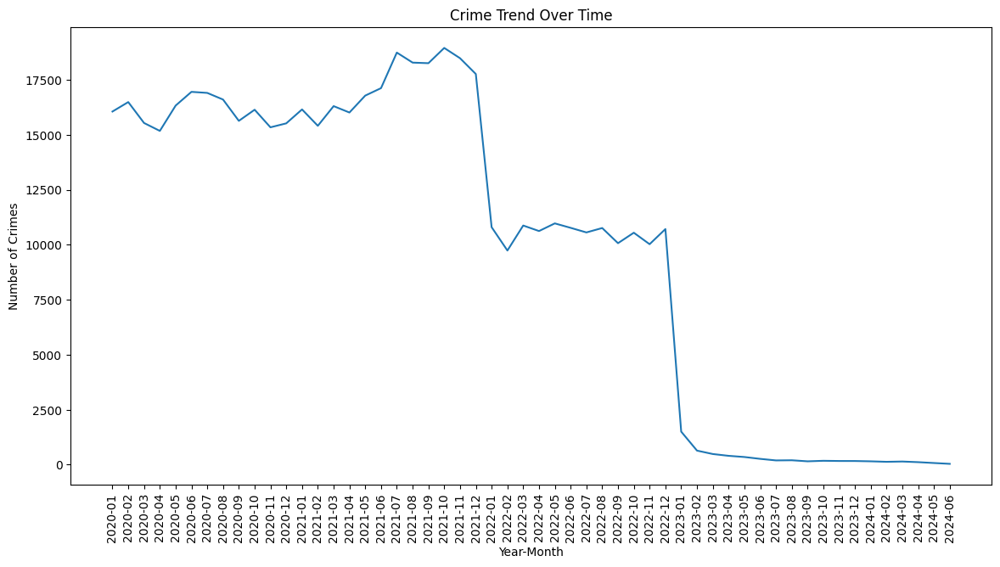

In [ ]:
# Crime Trend over time

# Extract year and month from 'Date Rptd'
df['YearMonth'] = df['Date Rptd'].dt.to_period('M')

# Group by 'YearMonth' and count the number of occurrences
crime_trend = df['YearMonth'].value_counts().sort_index()

# Plot the data
plt.figure(figsize=(14, 7))
sns.lineplot(x=crime_trend.index.astype(str), y=crime_trend.values)
plt.title('Crime Trend Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=90)
plt.show()

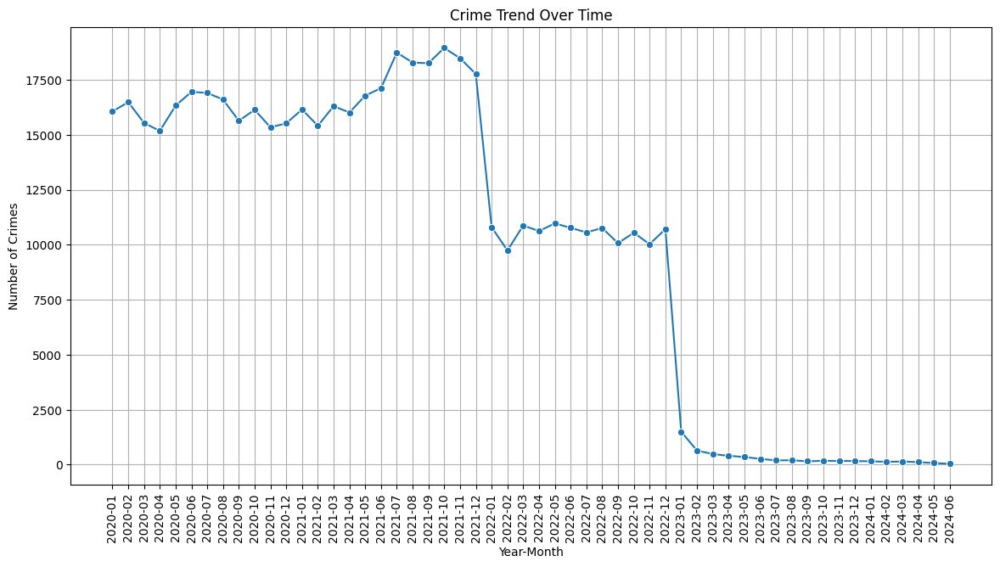

In [ ]:

# Ensure 'Date Rptd' is in datetime format
df['Date Rptd'] = pd.to_datetime(df['Date Rptd'])

# Extract Year-Month
df['YearMonth'] = df['Date Rptd'].dt.to_period('M')

# Group by 'YearMonth' and count occurrences
crime_trend = df.groupby('YearMonth').size()

# Convert PeriodIndex to string for plotting
crime_trend.index = crime_trend.index.astype(str)

# Plot the trend
plt.figure(figsize=(14, 7))
sns.lineplot(x=crime_trend.index, y=crime_trend.values, marker='o')

plt.title('Crime Trend Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=90)
plt.grid(True)

plt.show()


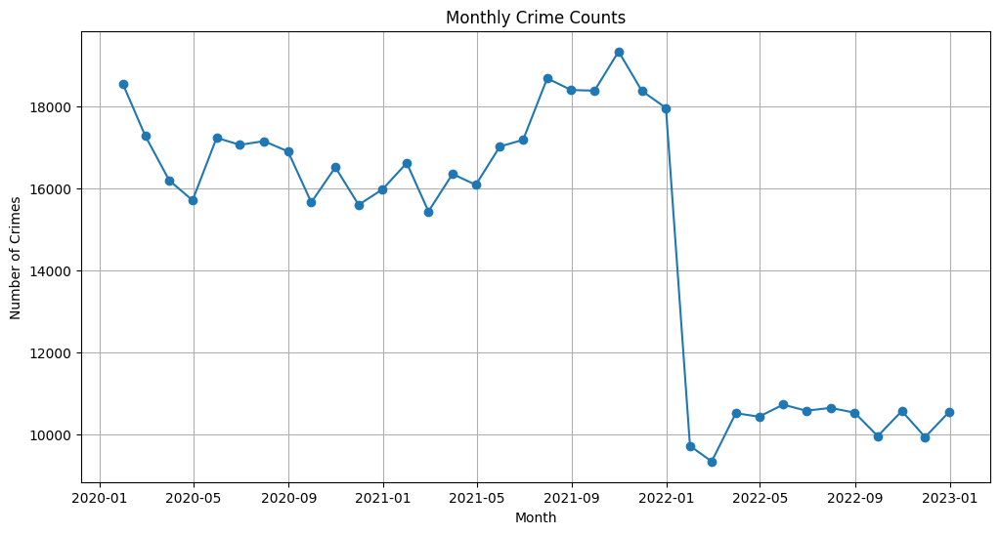

In [ ]:
# Time-Series Plots
# Grouping data by date and status
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Load dataset
df = pd.read_csv(r"/content/Crime_Data_from_2020_to_Present.csv")

# Convert the "DATE OCC" column to datetime format. Adjust format if needed.
df['DATE OCC'] = pd.to_datetime(df['DATE OCC'], errors='coerce')

# Drop rows where the date conversion failed
df = df.dropna(subset=['DATE OCC'])

# Set "DATE OCC" as the index for time series operations
df.set_index('DATE OCC', inplace=True)

# Resample the data by month to count the number of crimes per month
monthly_counts = df.resample('M').size()

# Plot the monthly crime counts
plt.figure(figsize=(12, 6))
plt.plot(monthly_counts.index, monthly_counts.values, marker='o', linestyle='-')
plt.title('Monthly Crime Counts')
plt.xlabel('Month')
plt.ylabel('Number of Crimes')
plt.grid(True)
plt.show()

# Perform seasonal decomposition on the monthly time series data
# decomposition = seasonal_decompose(monthly_counts, model='additive')
# decomposition.plot()
# plt.suptitle('Seasonal Decomposition of Monthly Crime Counts', fontsize=16)
# plt.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Ensure 'date_reported' is in datetime format
df['Date Rptd'] = pd.to_datetime(df['Date Rptd'], errors='coerce')

# Drop rows with missing dates if any
df = df.dropna(subset=['Date Rptd'])

# Group data by date (converted to date only) and status; rename the date column
time_series_status = df.groupby([df['Date Rptd'].dt.date.rename('Date Rptd'), 'Status']).size().reset_index(name='counts')

# Create the line plot
fig = px.line(time_series_status, x='Date Rptd', y='counts', color='Status',
              title='Crime Reports Over Time by Status')

fig.update_xaxes(title_text='Date')
fig.update_yaxes(title_text='Number of Crimes Reported')
fig.update_layout(height=600, width=1000)
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Ensure 'date_reported' is in datetime format
df['Date Rptd'] = pd.to_datetime(df['Date Rptd'], errors='coerce')
df = df.dropna(subset=['Date Rptd'])

# If the area column is named "AREA NAME", rename it to "area_name" for consistency.
if 'AREA NAME' in df.columns:
    df.rename(columns={'AREA NAME': 'area_name'}, inplace=True)

# Group data by date (converted to date only) and area_name; rename the grouped date column to 'date_reported'
time_series_area = df.groupby([df['Date Rptd'].dt.date.rename('Date Rptd'), 'area_name'])\
                     .size().reset_index(name='counts')

# Create the line plot
fig = px.line(time_series_area, x='Date Rptd', y='counts', color='area_name',
              title='Crime Reports Over Time by Area')
fig.update_xaxes(title_text='Date')
fig.update_yaxes(title_text='Number of Crimes Reported')
fig.update_layout(height=600, width=1000)
fig.show()


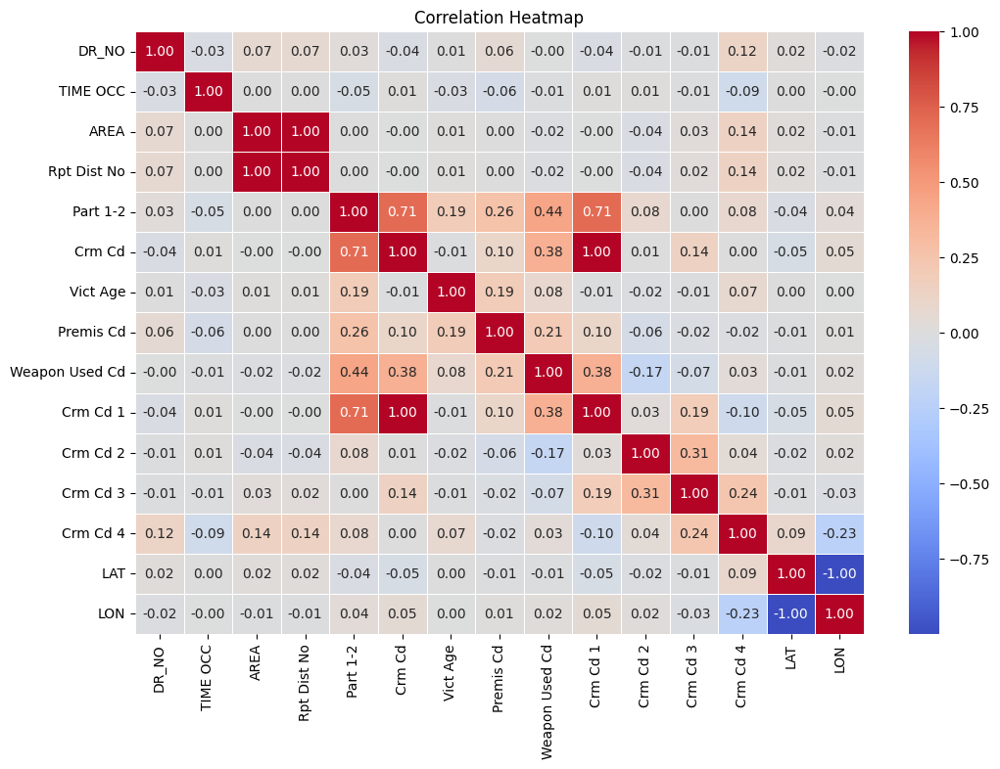

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure only numeric columns are considered
numeric_df = df.select_dtypes(include=['number'])  # Select only numeric columns

# Compute the correlation matrix
correlation_matrix = numeric_df.corr()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()


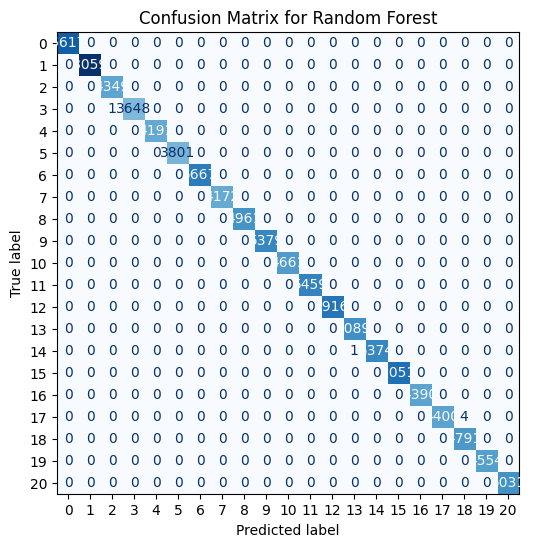

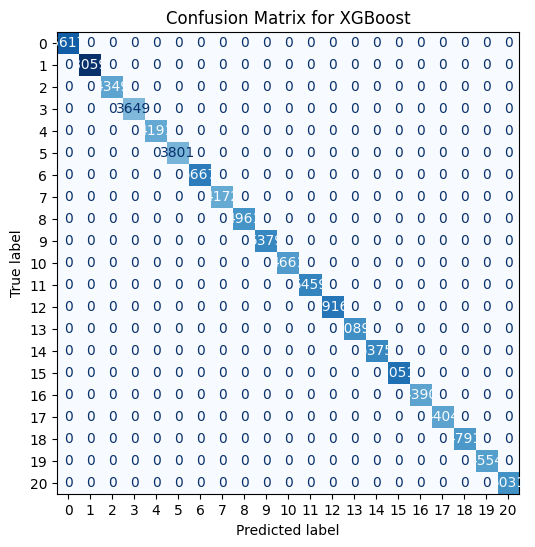

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Ensure training data exists
assert 'X_train' in locals() and 'y_train' in locals(), "X_train or y_train is not defined!"
assert 'X_test' in locals() and 'y_test' in locals(), "X_test or y_test is not defined!"

# Train Random Forest Model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Train XGBoost Model
xgb_model = XGBClassifier(eval_metric='mlogloss')
xgb_model.fit(X_train, y_train)

# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(8, 6))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap='Blues', values_format='d', ax=plt.gca(), colorbar=False)

    plt.title(f'Confusion Matrix for {model_name}')
    plt.show()

# Predictions and Confusion Matrix for Random Forest
y_pred_rf = rf_model.predict(X_test)
plot_confusion_matrix(y_test, y_pred_rf, "Random Forest")

# Predictions and Confusion Matrix for XGBoost
y_pred_xgb = xgb_model.predict(X_test)
plot_confusion_matrix(y_test, y_pred_xgb, "XGBoost")



In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder

# Function for model evaluation
def evaluate_models(X_train, y_train, X_test, y_test):
    models = {
        "Logistic Regression": LogisticRegression(max_iter=1000),
        "Decision Tree": DecisionTreeClassifier(),
        "Random Forest": RandomForestClassifier(),
        "SVM": SVC(),
        "Gradient Boosting": GradientBoostingClassifier(),
        "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric="mlogloss")
    }

    results = {}

    for name, model in models.items():
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        accuracy = accuracy_score(y_test, predictions) * 100
        results[name] = accuracy
        print(f"{name} Accuracy: {accuracy:.2f}%")

    best_model = max(results, key=results.get)
    print(f"\nBest Predictive Model: {best_model} with {results[best_model]:.2f}% accuracy")
    return results, best_model

try:
    df = pd.read_csv(r"/content/Crime_Data_from_2020_to_Present.csv")
    df = df.sample(frac=0.1, random_state=42)
    df['Date Rptd'] = pd.to_datetime(df['Date Rptd'])
    df.set_index('Date Rptd', inplace=True)

    # Encode categorical features
    le = LabelEncoder()
    df['AREA NAME'] = le.fit_transform(df['AREA NAME'])
    df['Crm Cd Desc'] = le.fit_transform(df['Crm Cd Desc'])

    # Prepare data
    X = df[['AREA NAME', 'Crm Cd Desc']]
    y = df['AREA NAME']  # Replace with target variable

    # Train/Test Split
    split_idx = int(0.8 * len(X))
    X_train, X_test = X[:split_idx], X[split_idx:]
    y_train, y_test = y[:split_idx], y[split_idx:]

    # Evaluate models
    evaluate_models(X_train, y_train, X_test, y_test)

except FileNotFoundError:
    print("Error: CSV file not found.")
except KeyError as e:
    print(f"Error: Column '{e.args[0]}' not found in CSV.")
except Exception as e:
    print(f"An unexpected error occurred: {e}")

<ipython-input-7-4f70463f21d4>:38: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Date Rptd'] = pd.to_datetime(df['Date Rptd'])
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Accuracy: 62.56%
Decision Tree Accuracy: 100.00%
Random Forest Accuracy: 99.96%
SVM Accuracy: 47.04%
Gradient Boosting Accuracy: 100.00%


/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [05:58:26] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGBoost Accuracy: 100.00%

Best Predictive Model: Decision Tree with 100.00% accuracy


In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

# Optimized Forecast Function - Avoiding Zero Predictions
def optimized_autoregressive_forecast(data, lags, steps):
    predictions = []
    data = np.array(data)

    # Ensure enough data points
    if len(data) < lags or np.all(data == data[0]):
        return [np.nan] * steps  # Skip if constant or insufficient data

    X, y = [], []
    for i in range(lags, len(data)):
        X.append(data[i-lags:i])
        y.append(data[i])

    X, y = np.array(X), np.array(y)

    # Check for constant data
    if np.std(y) == 0:
        return [max(1, y[0])] * steps  # Ensure predictions are at least 1

    # Fit the model
    model = LinearRegression()
    model.fit(X, y)

    # Forecast future values
    for _ in range(steps):
        next_input = data[-lags:].reshape(1, -1)
        prediction = model.predict(next_input)[0]
        predictions.append(max(1, prediction))  # Avoid negative or zero predictions
        data = np.append(data, prediction)

    return predictions

# Main Script
try:
    df = pd.read_csv(r"/content/Crime_Data_from_2020_to_Present.csv")
    # Enhanced date parsing with explicit format
    df['Date Rptd'] = pd.to_datetime(df['Date Rptd'], format='%m/%d/%Y %I:%M:%S %p', errors='coerce')
    df.dropna(subset=['Date Rptd'], inplace=True)  # Remove invalid dates
    print("Sample data after date parsing:")
    print(df.head())  # Log to confirm date parsing worked

    # Check for unexpected formats
    if df.empty:
        print("Error: Date parsing failed. Check date formats in CSV.")
        exit()

    df.set_index('Date Rptd', inplace=True)

    # Aggregate crime data
    monthly_crime_sum = df.groupby([pd.Grouper(freq='MS'), 'AREA NAME', 'Crm Cd Desc']).size().unstack(['AREA NAME', 'Crm Cd Desc'], fill_value=0)
    print(f"Shape of aggregated data: {monthly_crime_sum.shape}")

    if monthly_crime_sum.empty:
        print("No data available after aggregation.")
        exit()

    predictions = []

    # Forecast for each area and crime type
    for area in monthly_crime_sum.columns.levels[0]:
        for crime_type in monthly_crime_sum[area].columns:
            y = monthly_crime_sum[area][crime_type].values
            y_train = y[:-1] if len(y) > 1 else y

            # Log sample data for verification
            print(f"Area: {area}, Crime Type: {crime_type}, Sample Data: {y_train[-5:]}")

            # Skip if no variability in data
            if len(y_train) < 1 or np.all(y_train == 0):
                predictions.append({'Date': np.nan, 'Area': area, 'Crime_Type': crime_type, 'Prediction': np.nan})
                continue

            # Perform forecasting
            pred = optimized_autoregressive_forecast(y_train, lags=12, steps=12)

            for i, value in enumerate(pred):
                predictions.append({
                    'Date': monthly_crime_sum.index[-1] + pd.DateOffset(months=i + 1),
                    'Area': area,
                    'Crime_Type': crime_type,
                    'Prediction': int(round(value)) if not np.isnan(value) else np.nan
                })

    # Convert predictions to DataFrame
    predictions_df = pd.DataFrame(predictions)
    print(predictions_df.sample(frac=0.1, random_state=42) )

except FileNotFoundError:
    print("Error: CSV file not found.")
except KeyError as e:
    print(f"Error: Column '{e.args[0]}' not found in CSV.")
except Exception as e:
    print(f"An unexpected error occurred: {e}")


Sample data after date parsing:
       DR_NO  Date Rptd                DATE OCC  TIME OCC  AREA  AREA NAME  \
0  190326475 2020-03-01  03/01/2020 12:00:00 AM      2130     7   Wilshire   
1  200106753 2020-02-09  02/08/2020 12:00:00 AM      1800     1    Central   
2  200320258 2020-11-11  11/04/2020 12:00:00 AM      1700     3  Southwest   
3  200907217 2023-05-10  03/10/2020 12:00:00 AM      2037     9   Van Nuys   
4  220614831 2022-08-18  08/17/2020 12:00:00 AM      1200     6  Hollywood   

   Rpt Dist No  Part 1-2  Crm Cd                               Crm Cd Desc  \
0          784         1     510                          VEHICLE - STOLEN   
1          182         1     330                     BURGLARY FROM VEHICLE   
2          356         1     480                             BIKE - STOLEN   
3          964         1     343  SHOPLIFTING-GRAND THEFT ($950.01 & OVER)   
4          666         2     354                         THEFT OF IDENTITY   

   ... Status   Status Desc Cr

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

# Linear Regression Forecast Function
def linear_regression_forecast(data, steps):
    predictions = []
    data = np.array(data).reshape(-1, 1)
    X = np.arange(len(data)).reshape(-1, 1)

    # Fit Linear Regression Model
    model = LinearRegression()
    model.fit(X, data)

    # Forecast Future Values
    for step in range(1, steps + 1):
        next_index = len(data) + step - 1
        prediction = model.predict(np.array([[next_index]]))[0][0]
        predictions.append(max(0, prediction))  # Ensure predictions are non-negative

    return predictions

# Main Script
try:
    df = pd.read_csv('Crime_Data_from_2020_to_Present.csv')
    df['Date Rptd'] = pd.to_datetime(df['Date Rptd'], errors='coerce')
    df.dropna(subset=['Date Rptd'], inplace=True)

    df.set_index('Date Rptd', inplace=True)
    monthly_crime_sum = df.groupby([pd.Grouper(freq='MS'), 'AREA NAME']).size().unstack('AREA NAME', fill_value=0)
    print("Shape of aggregated data:", monthly_crime_sum.shape)
    print(monthly_crime_sum.head())  # Debug: Check aggregation output

    if monthly_crime_sum.empty:
        print("No data available after aggregation.")
        exit()

    predictions = []
    for area in monthly_crime_sum.columns:
        y = monthly_crime_sum[area].values
        y_train = y[:-1] if len(y) > 1 else y

        print(f"Area: {area}, Training Data: {y_train}")  # Debug: Check training data

        if len(y_train) < 1 or np.all(y_train == 0):
            predictions.append({'Date': np.nan, 'Area': area, 'Prediction': np.nan})
            continue

        pred = linear_regression_forecast(y_train, steps=12)
        print(f"Predictions for {area}: {pred}")  # Debug: Check predictions

        for i, value in enumerate(pred):
            predictions.append({
                'Date': monthly_crime_sum.index[-1] + pd.DateOffset(months=i + 1),
                'Area': area,
                'Prediction': int(round(value)) if not np.isnan(value) else np.nan
            })

    predictions_df = pd.DataFrame(predictions)
    print(predictions_df)

except FileNotFoundError:
    print("Error: CSV file not found.")
except KeyError as e:
    print(f"Error: Column '{e.args[0]}' not found in CSV.")
except Exception as e:
    print(f"An unexpected error occurred: {e}")


Shape of aggregated data: (54, 21)
AREA NAME   77th Street  Central  Devonshire  Foothill  Harbor  Hollenbeck  \
Date Rptd                                                                    
2020-01-01         1136     1101         648       551     640         642   
2020-02-01         1067     1065         723       567     681         626   
2020-03-01         1006      931         613       599     691         675   
2020-04-01         1012      796         531       626     680         603   
2020-05-01         1071      892         620       581     756         658   

AREA NAME   Hollywood  Mission  N Hollywood  Newton  ...  Olympic  Pacific  \
Date Rptd                                            ...                     
2020-01-01        786      710          820     802  ...      714      821   
2020-02-01        893      742          777     788  ...      734      827   
2020-03-01        747      703          769     795  ...      752      861   
2020-04-01        771      6

In [ ]:

from sklearn.linear_model import LinearRegression

# Optimized Forecast Function Using Linear Regression
def linear_regression_forecast(data, steps):
    predictions = []
    data = np.array(data).reshape(-1, 1)
    time_steps = np.arange(len(data)).reshape(-1, 1)

    # Fit Linear Regression model
    model = LinearRegression()
    model.fit(time_steps, data)

    # Forecast future values
    for i in range(1, steps + 1):
        future_step = np.array([[len(data) + i - 1]])
        prediction = model.predict(future_step)[0][0]
        predictions.append(max(1, prediction))  # Avoid negative predictions

    return predictions

# Main Script
try:
    df = pd.read_csv(r"/content/Crime_Data_from_2020_to_Present.csv")
    df['Date Rptd'] = pd.to_datetime(df['Date Rptd'], format='%m/%d/%Y %I:%M:%S %p', errors='coerce')
    df.dropna(subset=['Date Rptd'], inplace=True)
    df.set_index('Date Rptd', inplace=True)

    # Aggregate data by Area and Month
    monthly_crime_sum = df.groupby([pd.Grouper(freq='MS'), 'AREA NAME']).size().unstack(fill_value=0)

    predictions = []

    # Forecasting for each area
    for area in monthly_crime_sum.columns:
        y = monthly_crime_sum[area].values
        y_train = y[:-1] if len(y) > 1 else y

        # Perform forecasting
        pred = linear_regression_forecast(y_train, steps=12)

        for i, value in enumerate(pred):
            predictions.append({
                'Date': monthly_crime_sum.index[-1] + pd.DateOffset(months=i + 1),
                'Area': area,
                'Prediction': int(round(value))
            })

    # Convert predictions to DataFrame
    predictions_df = pd.DataFrame(predictions)
    print(predictions_df)

except FileNotFoundError:
    print("Error: CSV file not found.")
except KeyError as e:
    print(f"Error: Column '{e.args[0]}' not found in CSV.")
except Exception as e:
    print(f"An unexpected error occurred: {e}")


          Date         Area  Prediction
0   2024-07-01  77th Street           1
1   2024-08-01  77th Street           1
2   2024-09-01  77th Street           1
3   2024-10-01  77th Street           1
4   2024-11-01  77th Street           1
..         ...          ...         ...
247 2025-02-01     Wilshire           1
248 2025-03-01     Wilshire           1
249 2025-04-01     Wilshire           1
250 2025-05-01     Wilshire           1
251 2025-06-01     Wilshire           1

[252 rows x 3 columns]


In [ ]:
# Convert predictions to DataFrame if not already
if isinstance(predictions, list):
    predictions_df = pd.DataFrame(predictions)
else:
    predictions_df = predictions

# Check if DataFrame is empty
if predictions_df.empty:
    print("No predictions to plot.")
else:
    # Group predictions by date
    predictions_by_date = predictions_df.groupby('Date')['Prediction'].sum().reset_index()
    print(predictions_by_date)


         Date  Prediction
0  2024-07-01        2384
1  2024-08-01        2453
2  2024-09-01        2540
3  2024-10-01        2591
4  2024-11-01        2650
5  2024-12-01        2713
6  2025-01-01        2775
7  2025-02-01        2840
8  2025-03-01        2894
9  2025-04-01        2952
10 2025-05-01        2991
11 2025-06-01        3032


<ipython-input-8-d104be0724db>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Date', y='Prediction', data=predictions_by_date, palette='viridis')


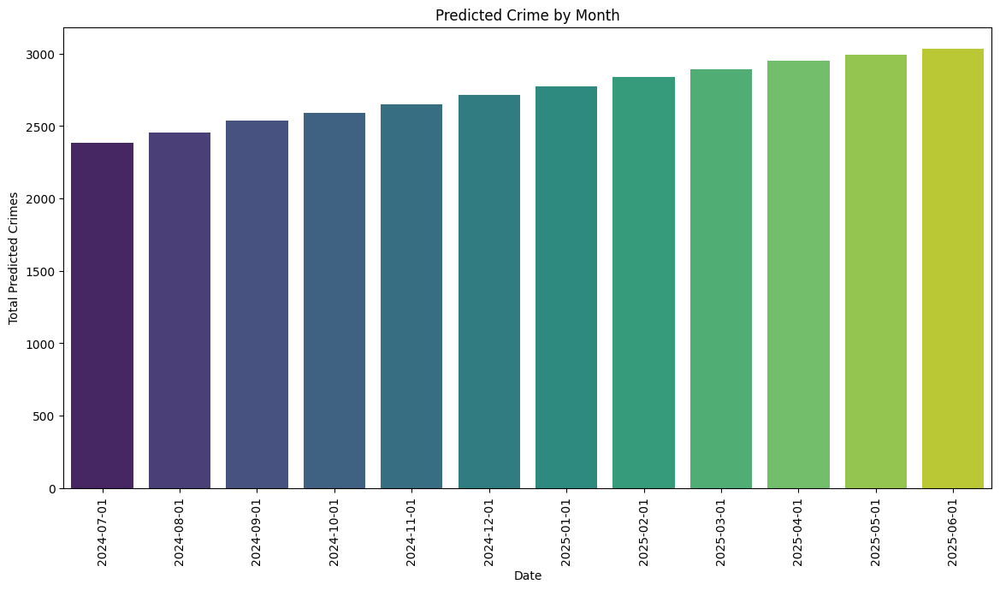

In [ ]:
# Convert predictions to DataFrame if not already
if isinstance(predictions, list):
    predictions_df = pd.DataFrame(predictions)
else:
    predictions_df = predictions

# Ensure predictions are not empty
if predictions_df.empty:
    print("No predictions available for plotting.")
else:
    # Predictions by Month
    predictions_by_date = predictions_df.groupby('Date')['Prediction'].sum().reset_index()

    # Plot the data
    import matplotlib.pyplot as plt
    import seaborn as sns

    plt.figure(figsize=(14, 7))
    sns.barplot(x='Date', y='Prediction', data=predictions_by_date, palette='viridis')
    plt.title('Predicted Crime by Month')
    plt.xlabel('Date')
    plt.ylabel('Total Predicted Crimes')
    plt.xticks(rotation=90)
    plt.show()
